In [1]:
import pandas as pd
import numpy as np 
import fastparquet

df = fastparquet.ParquetFile('train_ai_comp_final_dp.parquet').to_pandas()
print(df)

            id  target  sample_ml_new  feature1  feature2  feature3  feature4  \
0            0       0              1      1761      1759        85    105469   
1            1       0              1      1761      1759       120    105610   
2            2       0              1       890      1759       141    105227   
5            5       0              1      1599       966        30    102441   
6            6       0              1      1761      1759        85    104006   
...        ...     ...            ...       ...       ...       ...       ...   
693036  693036       0              1      1761      1759       141       410   
693038  693038       0              1      1761      1759         0       170   
693039  693039       0              1      1761      1759         0       168   
693040  693040       0              1      1761      1759       141        74   
693042  693042       1              1      1761      1759       141        28   

        feature5  feature6 

Считаем, сколько столбцов содержит Nan и какие это столбцы

In [2]:
print(set(np.array(df.isnull().sum())))
columns_with_nan = df.columns[df.isnull().any()].tolist()
print(columns_with_nan)
df=df.drop(['feature642', 'feature756'], axis=1)
print(df)

{0, 315324, 519615}
['feature642', 'feature756']
            id  target  sample_ml_new  feature1  feature2  feature3  feature4  \
0            0       0              1      1761      1759        85    105469   
1            1       0              1      1761      1759       120    105610   
2            2       0              1       890      1759       141    105227   
5            5       0              1      1599       966        30    102441   
6            6       0              1      1761      1759        85    104006   
...        ...     ...            ...       ...       ...       ...       ...   
693036  693036       0              1      1761      1759       141       410   
693038  693038       0              1      1761      1759         0       170   
693039  693039       0              1      1761      1759         0       168   
693040  693040       0              1      1761      1759       141        74   
693042  693042       1              1      1761      1759   

In [7]:
targets_ones=df[df['target']==1]
print(targets_ones)

            id  target  sample_ml_new  feature1  feature2  feature3  feature4  \
14          14       1              1      1761      1759       141    102068   
38          38       1              1      1761      1759        48    102563   
66          66       1              1      1554      1759        96    102374   
140        140       1              1      1143      1143        72    104095   
220        220       1              1      1690         8        22    102722   
...        ...     ...            ...       ...       ...       ...       ...   
692999  692999       1              1      1761      1759         4      2472   
693009  693009       1              1      1761      1759       141      1309   
693031  693031       1              1      1761      1759       141       143   
693034  693034       1              1      1761      1759       141       438   
693042  693042       1              1      1761      1759       141        28   

        feature5  feature6 

In [8]:
cor_matrix=targets_ones.corr()
print(cor_matrix)




                     id  target  sample_ml_new  feature1  feature2  feature3  \
id             1.000000     NaN            NaN  0.001466  0.010539  0.000063   
target              NaN     NaN            NaN       NaN       NaN       NaN   
sample_ml_new       NaN     NaN            NaN       NaN       NaN       NaN   
feature1       0.001466     NaN            NaN  1.000000  0.503028  0.031515   
feature2       0.010539     NaN            NaN  0.503028  1.000000  0.001361   
...                 ...     ...            ...       ...       ...       ...   
feature1072   -0.003052     NaN            NaN -0.010141 -0.017195  0.017260   
feature1073   -0.002049     NaN            NaN -0.027219 -0.027331  0.007130   
feature1074   -0.003977     NaN            NaN -0.027837 -0.031896  0.004065   
feature1075    0.002264     NaN            NaN -0.025963 -0.036183 -0.006795   
feature1076   -0.002139     NaN            NaN -0.018680 -0.028149 -0.006884   

               feature4  feature5  feat

In [3]:
df.describe()

,id,target,sample_ml_new,feature1,feature2,feature3,feature4,feature5,feature6,feature7,...,feature1067,feature1068,feature1069,feature1070,feature1071,feature1072,feature1073,feature1074,feature1075,feature1076
count,519615.000000,519615.000000,519615.0,519615.000000,519615.000000,519615.000000,519615.000000,519615.000000,519615.000000,519615.000000,...,519615.000000,519615.000000,519615.000000,519615.000000,519615.000000,519615.000000,519615.000000,519615.000000,519615.000000,519615.000000
mean,346719.616297,0.035674,1.0,1578.921015,1308.410059,76.305130,94386.514377,139.003685,41.424410,35.771227,...,7200.840365,13172.209817,26496.441469,2915.599988,3018.929802,3278.940904,5142.696679,7200.840365,13172.209817,26496.441469
std,200003.314087,0.185477,0.0,315.711163,660.446967,44.797241,22230.941664,74.734122,40.463193,56.144121,...,17892.604226,27943.888849,45663.346437,8948.724876,9129.809167,9669.071467,13822.903288,17892.604226,27943.888849,45663.346437
min,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,173594.500000,0.000000,1.0,1600.000000,769.000000,37.000000,97557.000000,63.000000,12.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,347002.000000,0.000000,1.0,1668.000000,1759.000000,76.000000,102538.000000,191.000000,31.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,519978.500000,0.000000,1.0,1761.000000,1759.000000,117.000000,104624.000000,191.000000,63.000000,125.000000,...,0.000000,5823.000000,35789.500000,0.000000,0.000000,0.000000,0.000000,0.000000,5823.000000,35789.500000
max,693042.000000,1.000000,1.0,1761.000000,1759.000000,141.000000,106448.000000,191.000000,284.000000,125.000000,...,83903.000000,117161.000000,168455.000000,49909.000000,50250.000000,51714.000000,69081.000000,83903.000000,117161.000000,168455.000000


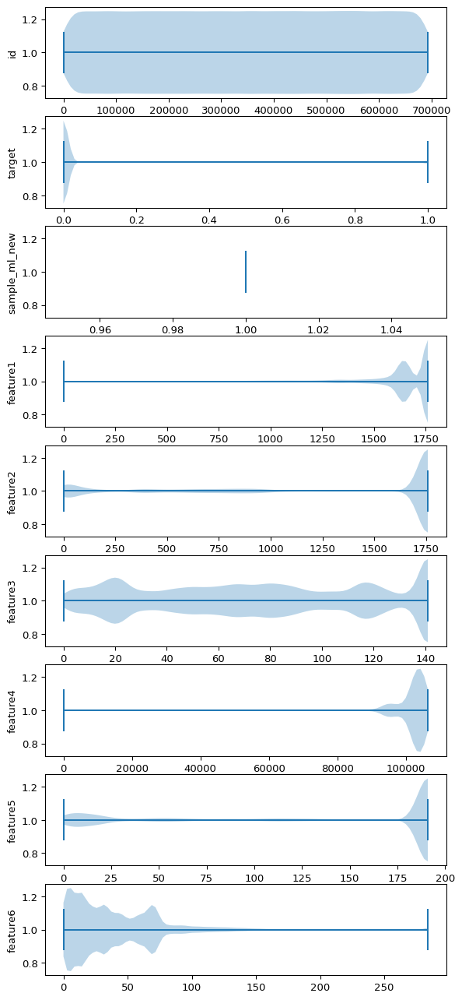

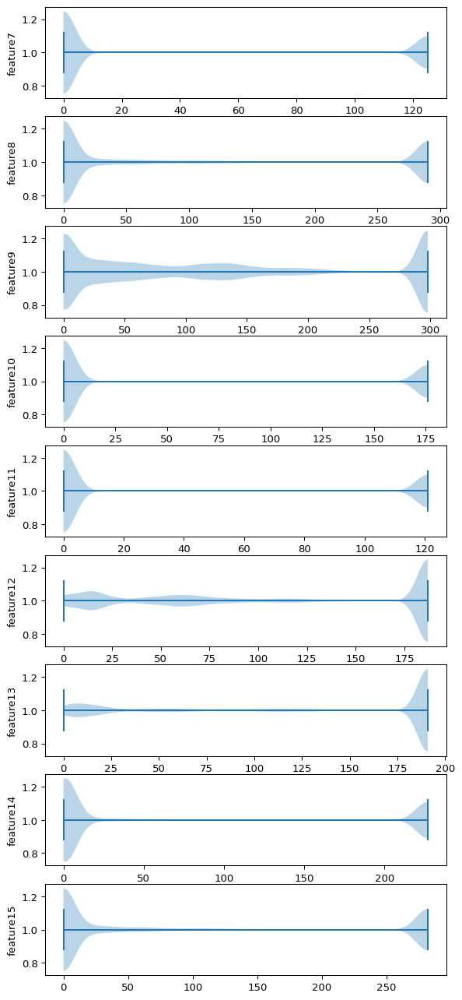

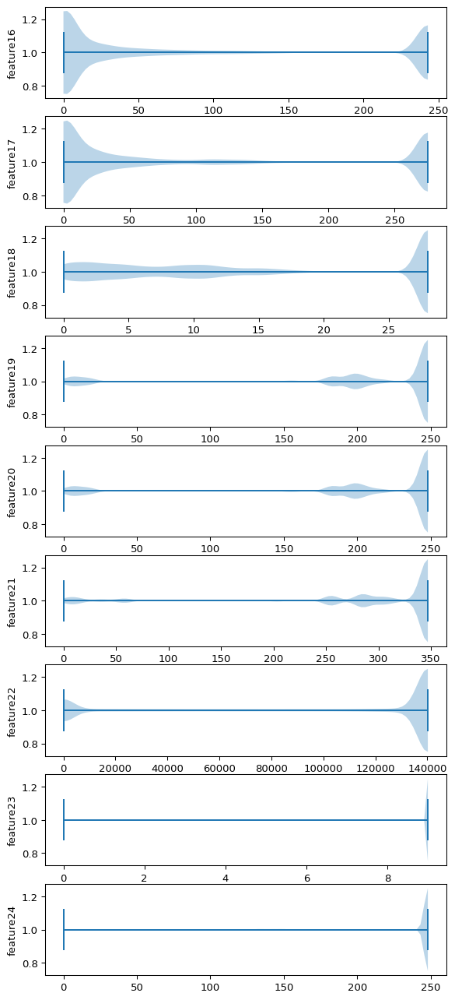

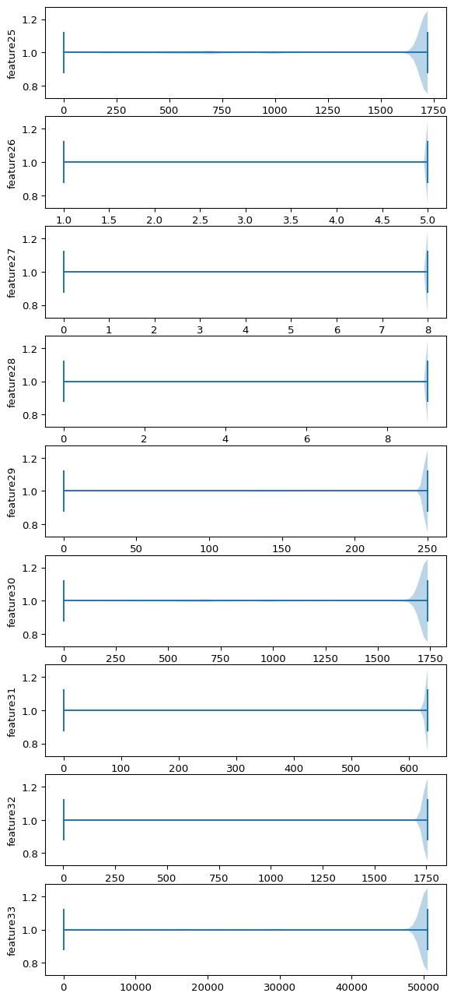

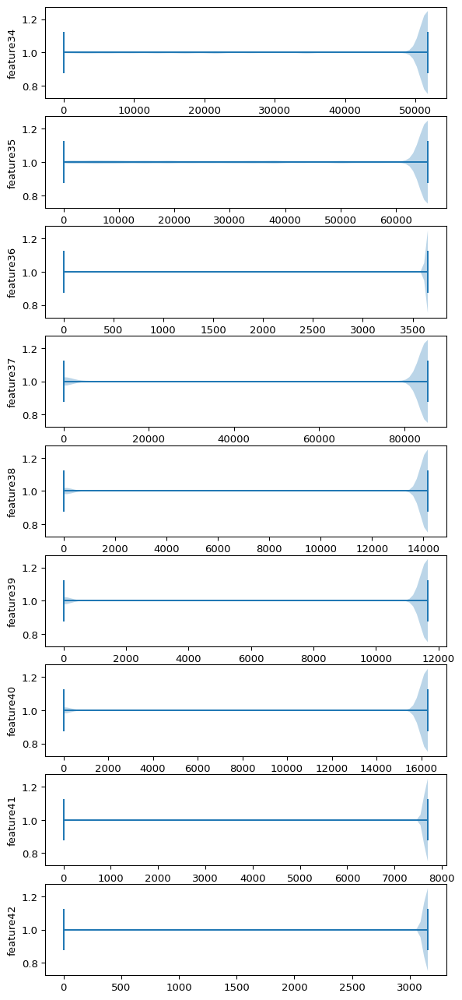

...

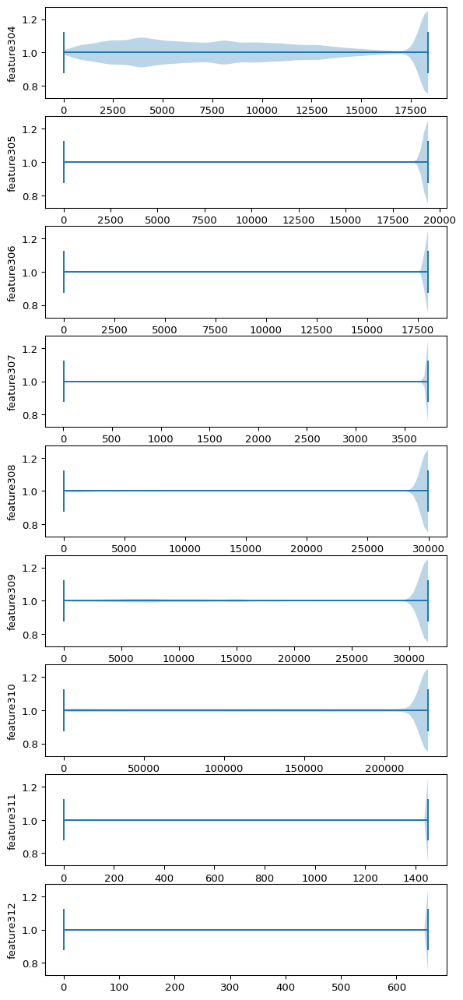

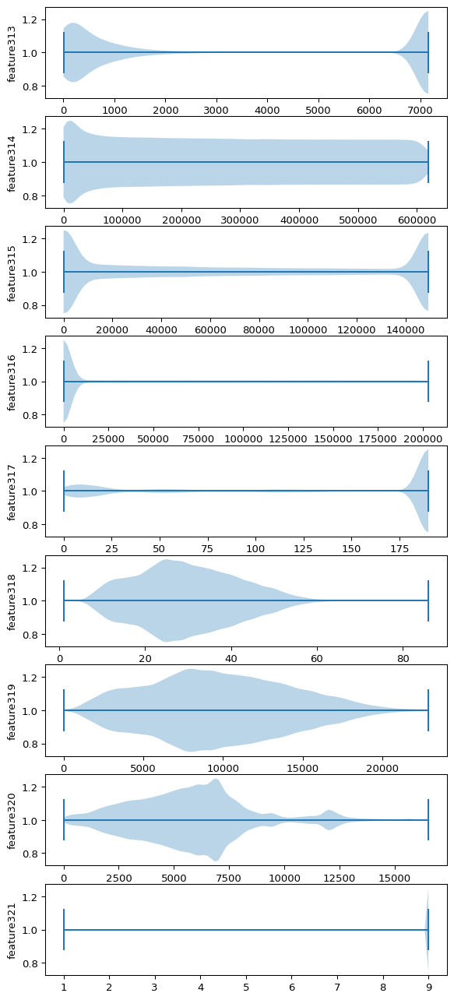

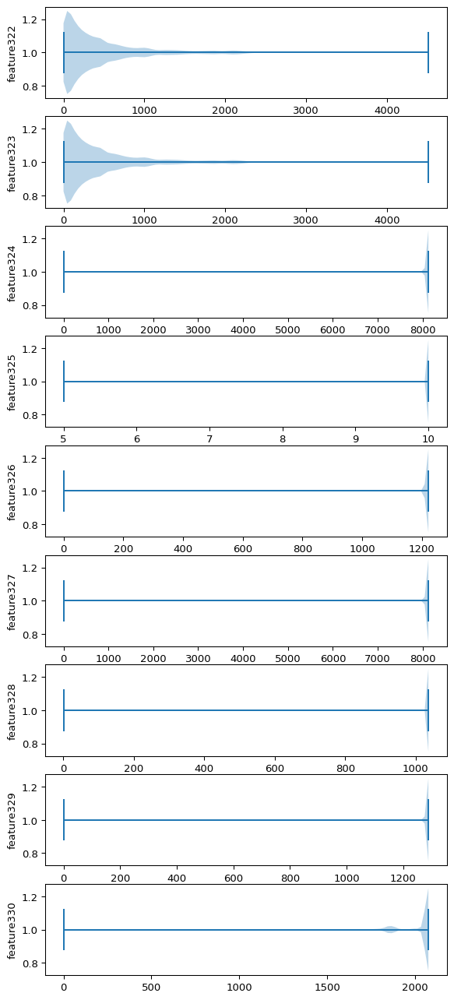

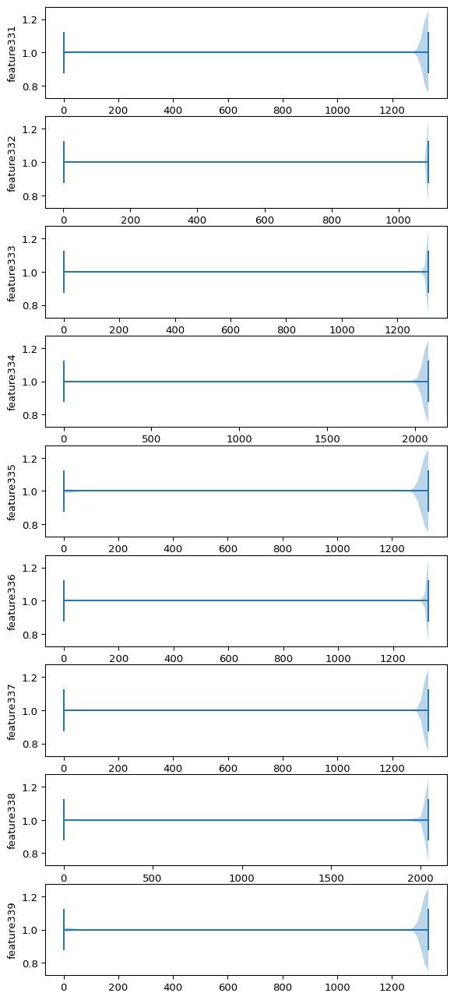

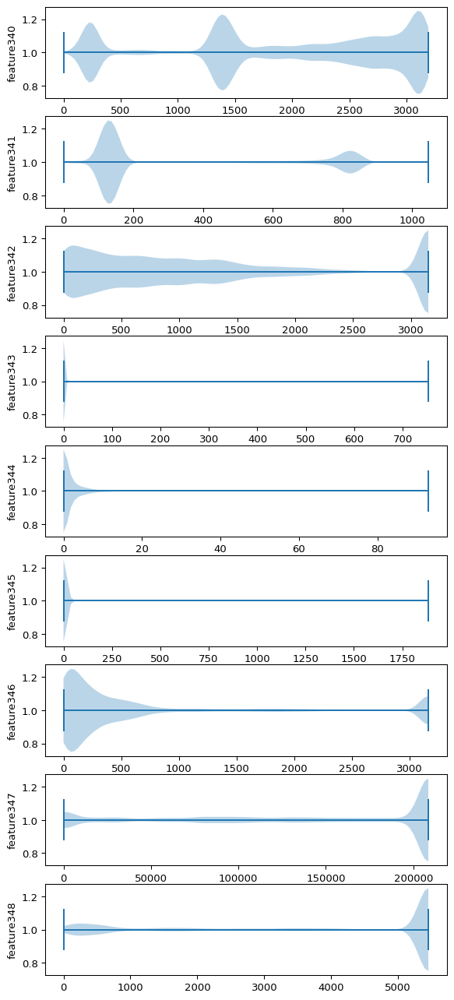

KeyboardInterrupt: 

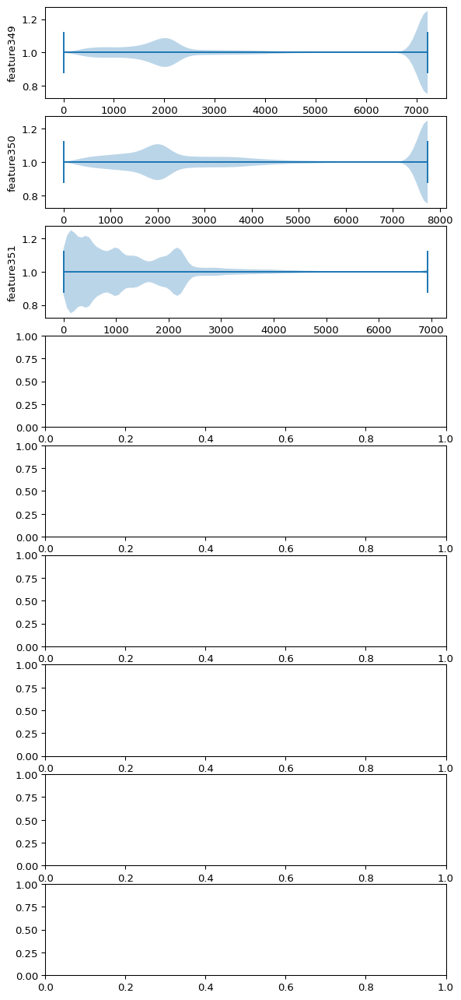

In [31]:
import matplotlib.pyplot as plt

columns = df.columns
num_columns = len(columns)

columns = df.columns
num_columns = len(columns)

for i in range(0, num_columns, 9):
    fig, axs = plt.subplots(9, 1, dpi=95, figsize=(7, 17))
    for j in range(9):
        if i+j < num_columns:
            box = axs[j].violinplot(df[columns[i+j]], vert=False)
            axs[j].set_ylabel(columns[i+j])
            #outliers = [f.get_xdata() for f in box['fliers']]
            #axs[j].text(1.1, 0.5, f'Outliers count: {len(outliers[0])}', transform=axs[j].transAxes)
    plt.show()

In [ ]:
correlation_matrix = df.corr()

print(correlation_matrix)

In [27]:
import pandas as pd
from scipy import stats
cor_list=[]

for i in df.columns:
    corr, p_value = stats.pointbiserialr(df['target'], df[i])
    cor_list.append(corr)
new_data=pd.DataFrame({'names': df.columns,'corr': cor_list})
new_data=new_data[3:]
new_data=new_data.sort_values(by='corr',ascending=True)
print(new_data)

/home/aapopov/anaconda3/envs/purple/lib/python3.12/site-packages/scipy/stats/_stats_py.py:5546: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  rpb, prob = pearsonr(x, y)


            names      corr
954    feature954 -0.099747
944    feature944 -0.093787
953    feature953 -0.092172
952    feature952 -0.084415
943    feature943 -0.084397
...           ...       ...
1030  feature1030       NaN
1031  feature1031       NaN
1032  feature1032       NaN
1033  feature1033       NaN
1034  feature1034       NaN

[1074 rows x 2 columns]


In [1]:
new_data=new_data.sort_values(by='corr',ascending=False)
print(new_data)
slice_data=new_data[:200][:]
print(slice_data)
features=np.array(slice_data['names'])
features=np.append(features,['target','sample_ml_new'])
slices_df=df.filter(items=features)
print(slices_df)

NameError: name 'new_data' is not defined

In [ ]:
slices_df_corr=slices_df.corr()
print(slices_df_corr)

In [29]:

def remove_collinear_features(x, threshold):
    '''
    Objective:
        Remove collinear features in a dataframe with a correlation coefficient
        greater than the threshold. Removing collinear features can help a model 
        to generalize and improves the interpretability of the model.

    Inputs: 
        x: features dataframe
        threshold: features with correlations greater than this value are removed

    Output: 
        dataframe that contains only the non-highly-collinear features
    '''

    # Calculate the correlation matrix
    corr_matrix = x.corr()
    iters = range(len(corr_matrix.columns) - 1)
    drop_cols = []

    # Iterate through the correlation matrix and compare correlations
    for i in iters:
        for j in range(i+1):
            item = corr_matrix.iloc[j:(j+1), (i+1):(i+2)]
            col = item.columns
            row = item.index
            val = abs(item.values)

            # If correlation exceeds the threshold
            if val >= threshold:
                # Print the correlated features and the correlation value
                print(col.values[0], "|", row.values[0], "|", round(val[0][0], 2))
                drop_cols.append(col.values[0])

    # Drop one of each pair of correlated columns
    drops = set(drop_cols)
    x = x.drop(columns=drops)

    return x
redact_df=remove_collinear_features(slices_df, 0.7)
print(redact_df)

feature944 | feature954 | 0.97
feature953 | feature954 | 0.96
feature953 | feature944 | 0.93
feature952 | feature954 | 0.9
feature952 | feature944 | 0.87
feature952 | feature953 | 0.95
feature943 | feature954 | 0.92
feature943 | feature944 | 0.95
feature943 | feature953 | 0.96
feature943 | feature952 | 0.92
feature212 | feature954 | 0.94
feature212 | feature944 | 0.93
feature212 | feature953 | 0.94
feature212 | feature952 | 0.87
feature212 | feature943 | 0.92
feature213 | feature954 | 0.94
feature213 | feature944 | 0.93
feature213 | feature953 | 0.94
feature213 | feature952 | 0.87
feature213 | feature943 | 0.92
feature213 | feature212 | 1.0
feature916 | feature4 | 0.78
feature951 | feature954 | 0.82
feature951 | feature944 | 0.79
feature951 | feature953 | 0.88
feature951 | feature952 | 0.92
feature951 | feature943 | 0.85
feature951 | feature212 | 0.78
feature951 | feature213 | 0.78
feature930 | feature4 | 0.74
feature930 | feature916 | 0.93
feature907 | feature357 | 1.0
feature210 | fe

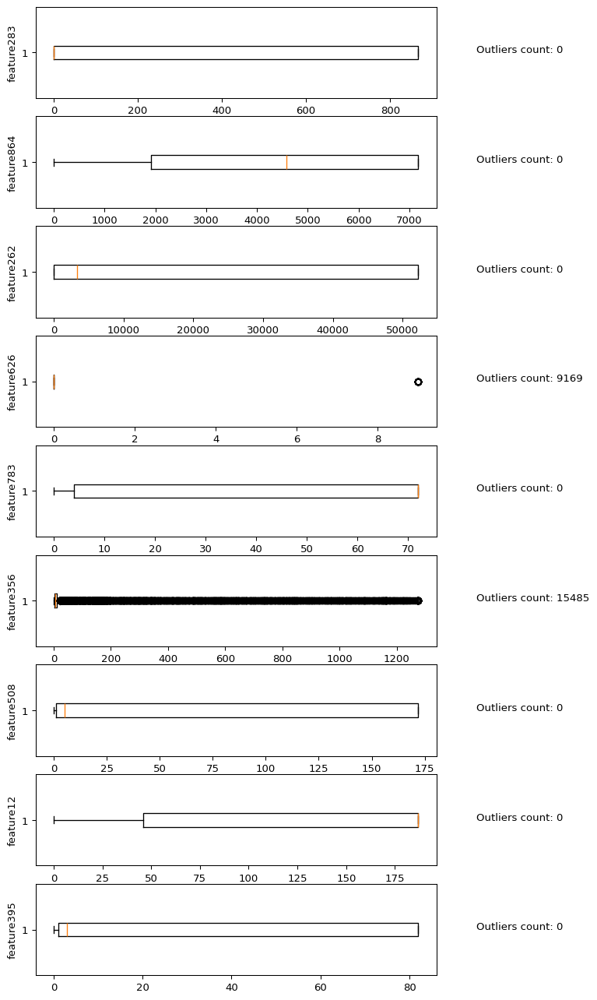

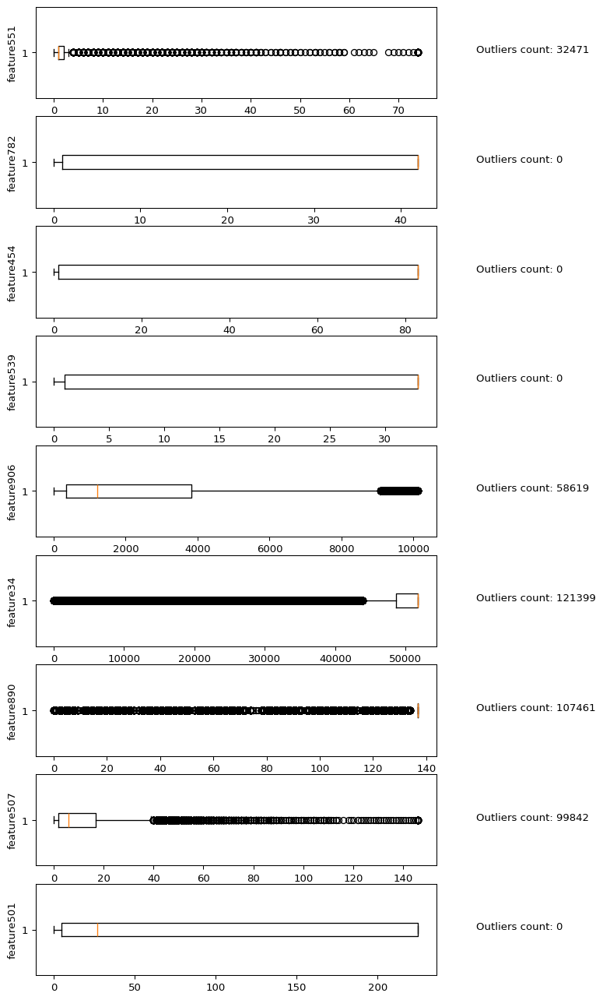

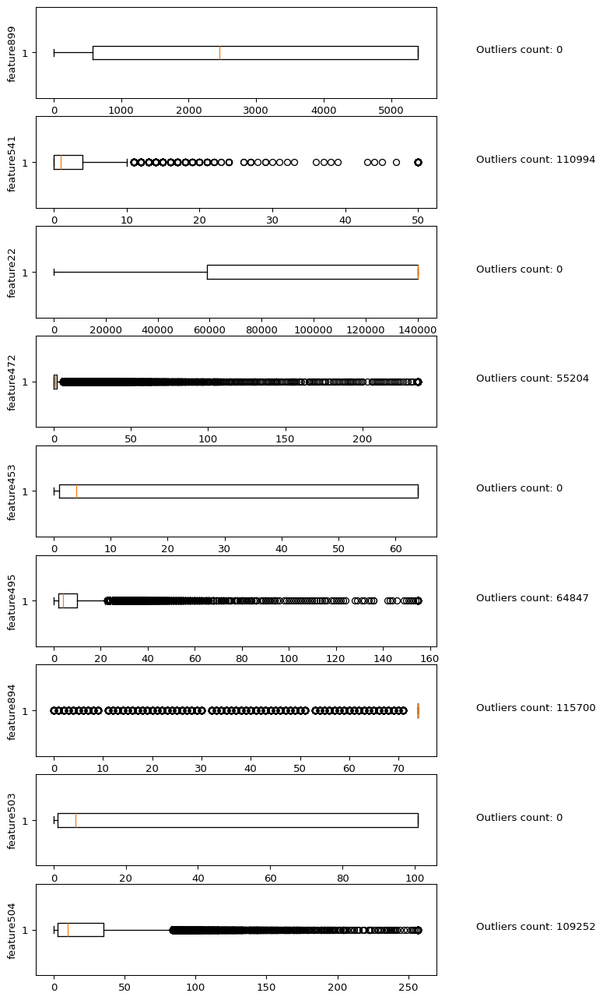

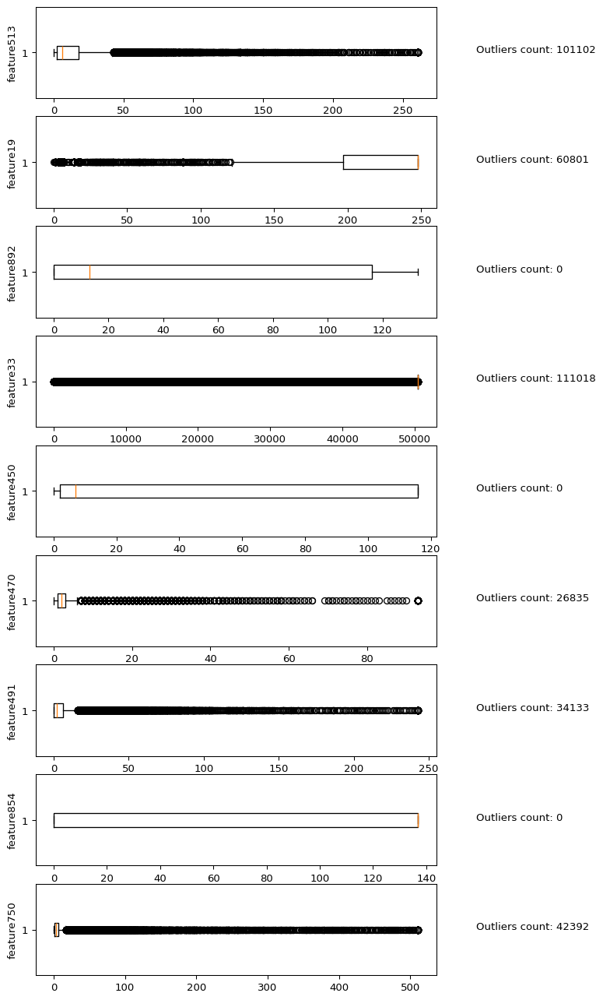

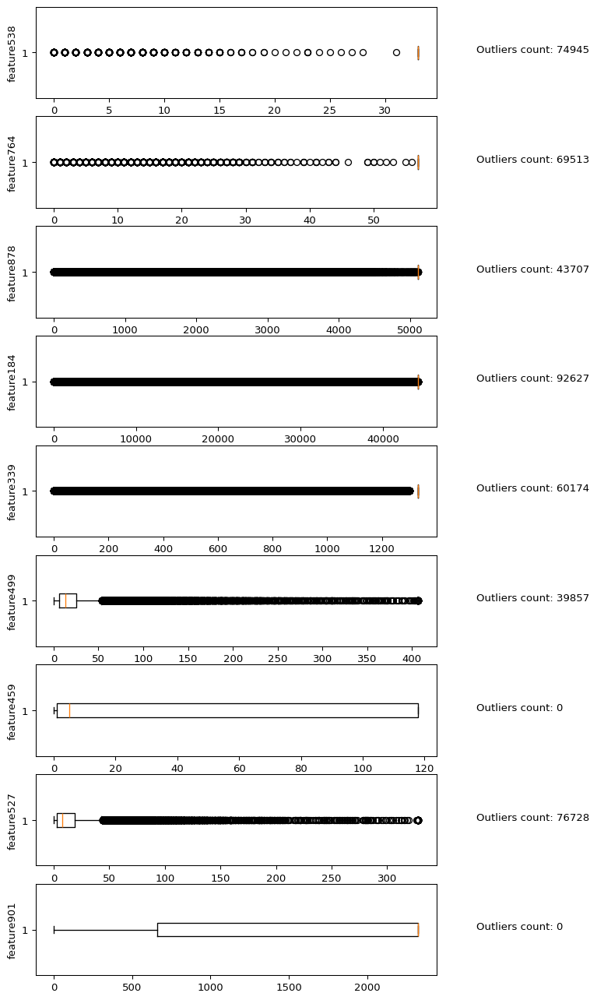

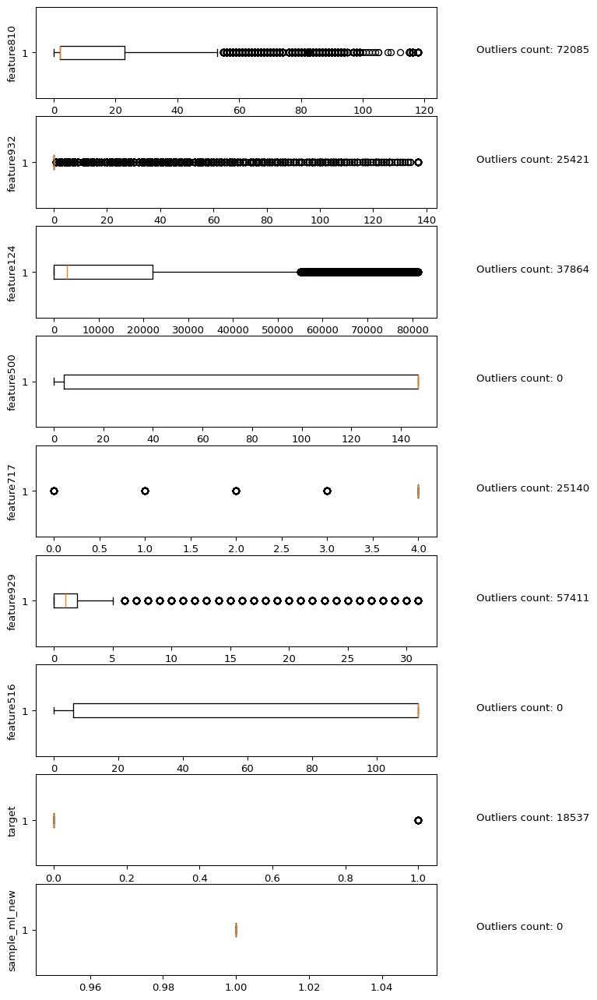

In [24]:

import matplotlib.pyplot as plt

columns = redact_df.columns
num_columns = len(columns)

columns = redact_df.columns
num_columns = len(columns)

for i in range(0, num_columns, 9):
    fig, axs = plt.subplots(9, 1, dpi=95, figsize=(7, 17))
    for j in range(9):
        if i+j < num_columns:
            box = axs[j].boxplot(redact_df[columns[i+j]], vert=False)
            axs[j].set_ylabel(columns[i+j])
            outliers = [f.get_xdata() for f in box['fliers']]
            axs[j].text(1.1, 0.5, f'Outliers count: {len(outliers[0])}', transform=axs[j].transAxes)
    plt.show()

In [30]:
slices_df.to_csv('Non_correlated_minus_features.txt',sep='\t',header=True,index=False)

In [15]:
import random 

targets_ones=df[df['target']==1]

targets_zeros=df.sample(len(targets_ones))

dataset_equal_classes=pd.concat([targets_ones,targets_zeros],axis=0)




            id  target  sample_ml_new  feature1  feature2  feature3  feature4  \
14          14       1              1      1761      1759       141    102068   
38          38       1              1      1761      1759        48    102563   
66          66       1              1      1554      1759        96    102374   
140        140       1              1      1143      1143        72    104095   
220        220       1              1      1690         8        22    102722   
...        ...     ...            ...       ...       ...       ...       ...   
54626    54626       0              1        23        23       129    105357   
351326  351326       0              1      1371        38       120    103888   
20344    20344       0              1      1761      1759       102    105482   
479618  479618       0              1      1761      1759       113    103021   
72787    72787       0              1      1761      1759       141      1397   

        feature5  feature6 

In [27]:

targets_ones=df[df['target']==1]

targets_zeros=df.sample(int(len(targets_ones)))

dataset_equal_classes=pd.concat([targets_ones,targets_zeros],axis=0)


import pandas as pd
from scipy import stats
cor_list=[]

for i in dataset_equal_classes.columns:
    corr, p_value = stats.pointbiserialr(dataset_equal_classes['target'], dataset_equal_classes[i])
    cor_list.append(corr)
new_data=pd.DataFrame({'names': dataset_equal_classes.columns,'corr': cor_list})
new_data=new_data[3:]
new_data=new_data.sort_values(by='corr',ascending=False)
print(new_data)


/home/aapopov/anaconda3/envs/purple/lib/python3.12/site-packages/scipy/stats/_stats_py.py:5546: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  rpb, prob = pearsonr(x, y)


            names      corr
864    feature864  0.172747
351    feature349  0.172541
285    feature283  0.153297
746    feature745  0.152824
286    feature284  0.152678
...           ...       ...
1030  feature1030       NaN
1031  feature1031       NaN
1032  feature1032       NaN
1033  feature1033       NaN
1034  feature1034       NaN

[1074 rows x 2 columns]


In [19]:
dataset_equal_classes.to_csv('Dataset_for_educat.csv',sep='\t', index=False)

In [20]:
!gzip Dataset_for_educat.csv

            names      corr
864    feature864  0.172458
351    feature349  0.172262
285    feature283  0.155926
746    feature745  0.155700
286    feature284  0.155530
...           ...       ...
1030  feature1030       NaN
1031  feature1031       NaN
1032  feature1032       NaN
1033  feature1033       NaN
1034  feature1034       NaN

[1074 rows x 2 columns]


            names      corr
954    feature954 -0.236356
944    feature944 -0.220375
953    feature953 -0.217702
952    feature952 -0.200786
943    feature943 -0.197029
...           ...       ...
1030  feature1030       NaN
1031  feature1031       NaN
1032  feature1032       NaN
1033  feature1033       NaN
1034  feature1034       NaN

[1074 rows x 2 columns]


            names      corr
954    feature954 -0.268907
944    feature944 -0.252115
953    feature953 -0.249369
952    feature952 -0.231483
943    feature943 -0.226893
...           ...       ...
1030  feature1030       NaN
1031  feature1031       NaN
1032  feature1032       NaN
1033  feature1033       NaN
1034  feature1034       NaN

[1074 rows x 2 columns]


feature8 | feature7 | 0.97
feature9 | feature7 | 0.91
feature9 | feature8 | 0.89
feature10 | feature7 | 1.0
feature10 | feature8 | 0.97
feature10 | feature9 | 0.91
feature11 | feature7 | 1.0
feature11 | feature8 | 0.97
feature11 | feature9 | 0.91
feature11 | feature10 | 1.0
feature13 | feature5 | 1.0
feature14 | feature7 | 0.98
feature14 | feature8 | 0.99
feature14 | feature9 | 0.9
feature14 | feature10 | 0.98
feature14 | feature11 | 0.99
feature15 | feature7 | 0.97
feature15 | feature8 | 1.0
feature15 | feature9 | 0.89
feature15 | feature10 | 0.97
feature15 | feature11 | 0.97
feature15 | feature14 | 0.99
feature16 | feature7 | 0.96
feature16 | feature8 | 0.94
feature16 | feature9 | 0.95
feature16 | feature10 | 0.96
feature16 | feature11 | 0.96
feature16 | feature14 | 0.96
feature16 | feature15 | 0.95
feature17 | feature7 | 0.95
feature17 | feature8 | 0.93
feature17 | feature9 | 0.95
feature17 | feature10 | 0.95
feature17 | feature11 | 0.95
feature17 | feature14 | 0.95
feature17 | feat

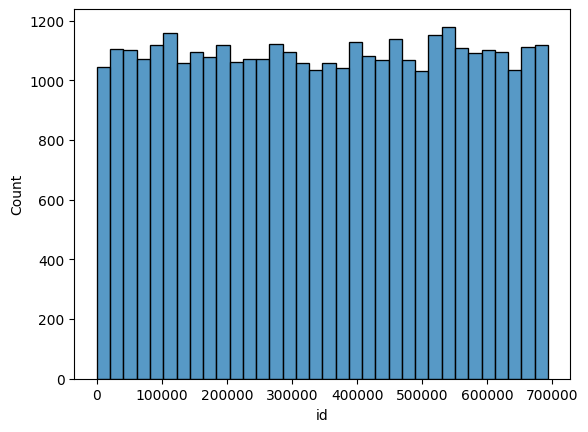

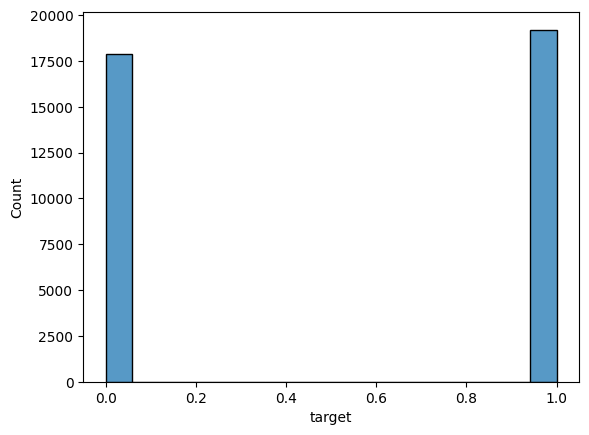

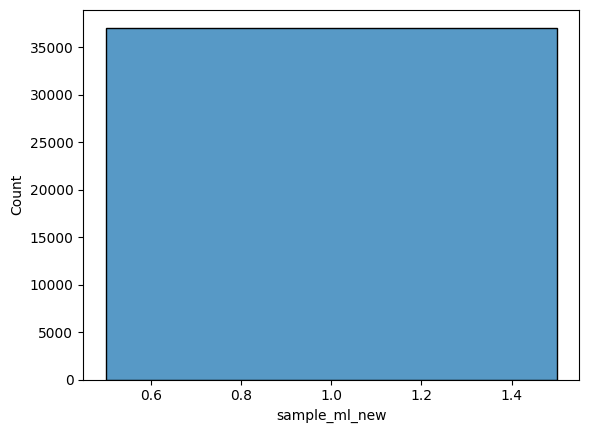

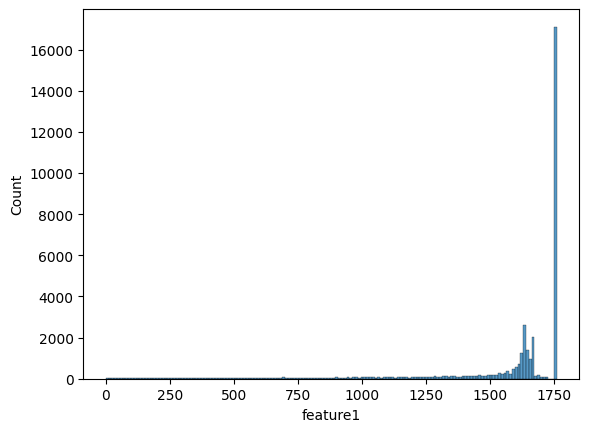

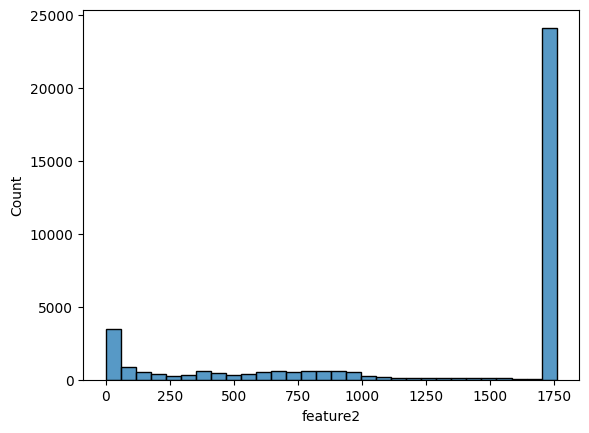

...

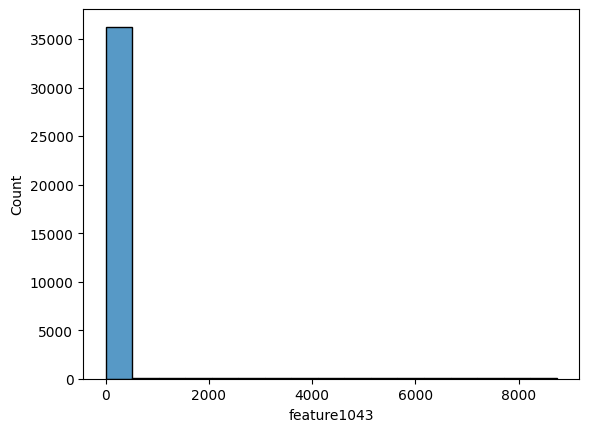

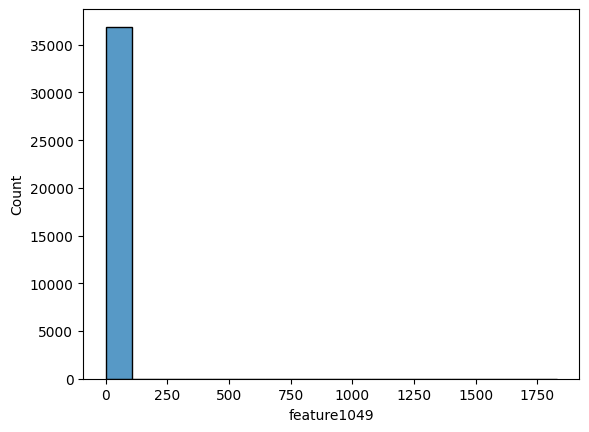

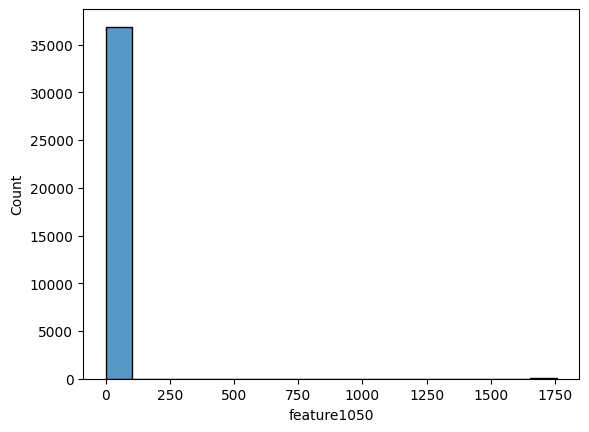

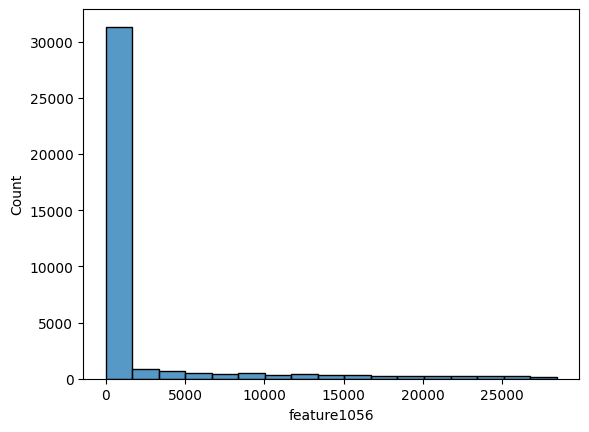

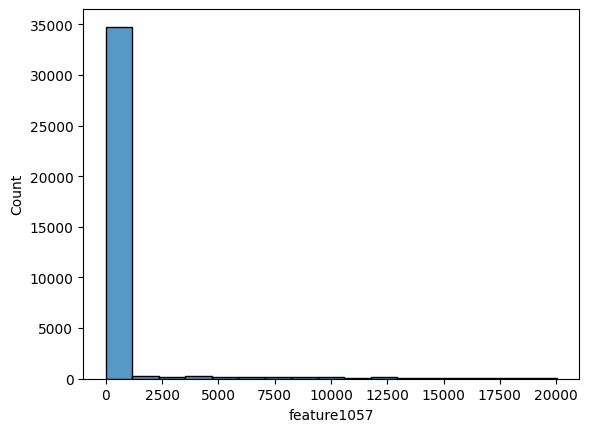

In [33]:
import seaborn as sns 


def remove_collinear_features(x, threshold):
    '''
    Objective:
        Remove collinear features in a dataframe with a correlation coefficient
        greater than the threshold. Removing collinear features can help a model 
        to generalize and improves the interpretability of the model.

    Inputs: 
        x: features dataframe
        threshold: features with correlations greater than this value are removed

    Output: 
        dataframe that contains only the non-highly-collinear features
    '''

    # Calculate the correlation matrix
    corr_matrix = x.corr()
    iters = range(len(corr_matrix.columns) - 1)
    drop_cols = []

    # Iterate through the correlation matrix and compare correlations
    for i in iters:
        for j in range(i+1):
            item = corr_matrix.iloc[j:(j+1), (i+1):(i+2)]
            col = item.columns
            row = item.index
            val = abs(item.values)

            # If correlation exceeds the threshold
            if val >= threshold:
                # Print the correlated features and the correlation value
                print(col.values[0], "|", row.values[0], "|", round(val[0][0], 2))
                drop_cols.append(col.values[0])

    # Drop one of each pair of correlated columns
    drops = set(drop_cols)
    x = x.drop(columns=drops)

    return x
redact_df=remove_collinear_features(dataset_equal_classes, 0.7)
print(redact_df)

for i in redact_df.columns:
    sns.histplot(x=redact_df[i])
    plt.show()

In [34]:
redact_df.to_csv('Non_corr_datset.csv',sep='\t',index=False)
!gzip Non_corr_datset.csv

In [ ]:
zero_df=df[df['target']==0]
print(zero_df)
redact_df=remove_collinear_features(zero_df, 0.7)
zero_sabsam=redact_df.sample(100000)
print(zero_sabsam)

            id  target  sample_ml_new  feature1  feature2  feature3  feature4  \
0            0       0              1      1761      1759        85    105469   
1            1       0              1      1761      1759       120    105610   
2            2       0              1       890      1759       141    105227   
5            5       0              1      1599       966        30    102441   
6            6       0              1      1761      1759        85    104006   
...        ...     ...            ...       ...       ...       ...       ...   
693035  693035       0              1      1761      1759       141       429   
693036  693036       0              1      1761      1759       141       410   
693038  693038       0              1      1761      1759         0       170   
693039  693039       0              1      1761      1759         0       168   
693040  693040       0              1      1761      1759       141        74   

        feature5  feature6 

In [ ]:
zero_sabsam.to_csv('Zeros_dataset')

In [3]:
!gunzip Non_corr_datset.csv.gz

In [6]:
data_non=pd.read_csv('Non_corr_datset.csv',sep='\t')
print(data_non)

zero_df=df[df['target']==0]
zero_sabsam=zero_df.sample(100000)
zero_sabsam = zero_sabsam[zero_sabsam.columns.intersection(data_non.columns)]
print(zero_sabsam)

           id  target  sample_ml_new  feature1  feature2  feature3  feature4  \
0          14       1              1      1761      1759       141    102068   
1          38       1              1      1761      1759        48    102563   
2          66       1              1      1554      1759        96    102374   
3         140       1              1      1143      1143        72    104095   
4         220       1              1      1690         8        22    102722   
...       ...     ...            ...       ...       ...       ...       ...   
37069  425592       0              1      1761      1759       141    103080   
37070  302175       0              1      1761      1759        39    104320   
37071  519188       0              1      1761      1759        48    105033   
37072  687116       0              1      1659       395        85    104411   
37073  201335       0              1      1761      1759        39    103082   

       feature5  feature6  feature7  ..

In [7]:
zero_sabsam.to_csv('100k_zeros_data.csv',sep='\t',index=False)
!gzip 100k_zeros_data.csv

In [16]:
feat_1=df.loc[:,['target','feature1']]
print(feat_1[(feat_1['target']==1) & (feat_1['feature1'] != 1761)])
print(df.loc[:,['target','feature1']])

        target  feature1
66           1      1554
140          1      1143
220          1      1690
221          1       136
246          1      1637
...        ...       ...
692771       1        15
692779       1       733
692785       1       782
692895       1       479
692973       1       202

[9620 rows x 2 columns]
        target  feature1
0            0      1761
1            0      1761
2            0       890
5            0      1599
6            0      1761
...        ...       ...
693036       0      1761
693038       0      1761
693039       0      1761
693040       0      1761
693042       1      1761

[519615 rows x 2 columns]
